<a href="https://colab.research.google.com/github/NuoWenLei/Meta-Learner-Optimizer/blob/main/notebooks/LSTM_Meta_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# In this notebook, we will implement the model proposed in the paper **"Optimization as a Model for Few-Shot Learning"**

https://openreview.net/pdf?id=rJY0-Kcll


## Imports

In [ ]:
from google.colab import drive

In [ ]:
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential, Model
import numpy as np

2.7.0


## Hyper-parameters

In [ ]:
"""
- create dataset generator
- create restore_gradient_shape function
- define optimizers
- define + re-define ALL hyper-parameters
  - EPOCHS: metalearner training epochs
  - STEPS_PER_EPOCH: metalearner steps per epoch, dependent on batch size
  - LEARNER_EPOCHS: learner training epochs
  - LEARNER_STEPS_PER_EPOCH: learner steps per epoch
  - NUM_LEARNER_PARAMS: number of trainable parameters in a learner model
  - NUM_SHOT: number of samples from each class that creates a training dataset
              Ex: 5 shot from each of 10 classes creates a training dataset with 50 images
  - NUM_CLASSES: number of classes
  - NUM_SHOT_EVAL: number of samples from each class that creates a testing dataset
  - BATCH_SIZE: batch size for learner training
  - FILTERS: number of filters for the Conv2D layers in learner 
  - BLOCKS: number of Conv2D + ReLU + MaxPool2D blocks in learner
  - USE_BIAS: True/False include biases in learner model layers
"""

'\nTODO:\n- create dataset generator\n- create restore_gradient_shape function\n- define optimizers\n- define + re-define ALL hyper-parameters\n  - EPOCHS\n  - STEPS_PER_EPOCH\n  - LEARNER_EPOCHS\n  - LEARNER_STEPS_PER_EPOCH\n  - NUM_LEARNER_PARAMS\n  - NUM_SHOT\n  - NUM_CLASSES\n  - NUM_SHOT_EVAL\n  - BATCH_SIZE\n  - FILTERS\n  - BLOCKS\n'

In [ ]:
FILTERS = 32
BLOCKS = 2
BATCH_SIZE = 16
NUM_SHOT = 5
NUM_SHOT_EVAL = 15
USE_BIAS = True


## Get Data (fashion_MNIST)

Since we want to create a simple image classification problem, let's just use the fashion MNIST dataset.

The dataset contains black and white images of fashion items and the goal is to classify what kind of item they are.


Label and Description:
- 0	T-shirt/top
- 1	Trouser
- 2	Pullover
- 3	Dress
- 4	Coat
- 5	Sandal
- 6	Shirt
- 7	Sneaker
- 8	Bag
- 9	Ankle boot

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()

4431872/4422102 [==============================] - 0s 0us/step


9


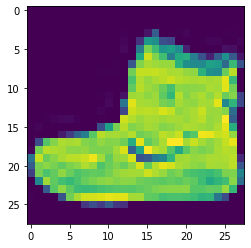

In [ ]:
# This is what an image sample would look like
plt.imshow(X_train[0])
print(y_train[0])

In [ ]:
NUM_CLASSES = y_train.max() - y_train.min() + 1

In [ ]:
NUM_CLASSES

10

In [ ]:
X_train = X_train / 255.
X_test = X_test / 255.

In [ ]:
# Shapes of data
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


In [ ]:
# Convert labels to one-hot format for ease of classification.
def to_onehot(data, num_classes):
  new_data = np.zeros((data.shape[0], num_classes))
  new_data[np.arange(0, data.shape[0]), data] = 1.
  return new_data

In [ ]:
y_train = to_onehot(y_train, NUM_CLASSES)
y_test = to_onehot(y_test, NUM_CLASSES)

In [ ]:
# Label shapes after one-hot encoding
print(y_train.shape, y_test.shape)

(60000, 10) (10000, 10)


In [ ]:
img_x, img_y = X_train.shape[1:]

In [ ]:
# Per the requirement of Conv layers, the shape of each image has to be 3D (x, y, channels/colors)
# So here I just expanded the image shape to 3D
X_train = X_train[:, :, :, np.newaxis]
X_train.shape

(60000, 28, 28, 1)

In [ ]:
X_test = X_test[:, :, :, np.newaxis]
X_test.shape

(10000, 28, 28, 1)

In [ ]:
from collections import Counter

In [ ]:
min(Counter(y_train.argmax(axis = -1).tolist()).values())

6000

## Preprocess Data for Few-Shot Learning

In [ ]:
X_train.shape

(60000, 28, 28, 1)

In [ ]:
# The hierarchial structure of data is quite complicated
# because we are training a model for each step of another model.

# Dataset Levels
# Top Level/Level 0:
# - D_meta_train
# - D_meta_test

# Level 1:
# - D_train
# - D_test

# Level 2:
# - X_train
# - X_test
# - y_train
# - y_test


def preprocess_data(package):

  # Since Keras gave me X_train, y_train, X_test, and y_test,
  # I chose to process by (X, y) instead of everything at once
  (X, y) = package

  # For the meta-learner to have equal exposure to each class,
  # each batch of Level 2 data requires an equal sample of each class,
  # therefore, here I'm finding the class with the least samples.
  min_objects = min(Counter(y.argmax(axis = -1).tolist()).values())

  # Get the total number of samples for each class needed for a batch of Level 1 datasets
  num_of_class_per_dataset = NUM_SHOT + NUM_SHOT_EVAL

  # Randomize order of samples,
  # so repeated epochs that didn't use all the data won't train with the same samples
  perm = np.random.permutation(y.shape[0])
  X = X[perm]
  y = y[perm]

  # Create slices of data based on which class,
  # this is to have easier access to samples from each class
  X_slices = dict((i, X[y.argmax(axis = -1) == i, ...]) for i in range(NUM_CLASSES))
  y_slices = dict((i, y[y.argmax(axis = -1) == i, ...]) for i in range(NUM_CLASSES))

  # Init empty Level 0 dataset
  datasets = []

  # Looping through all samples
  # by steps of needed sample number per Level 1 dataset
  for i in range(0, min_objects, num_of_class_per_dataset):

    # Init all Level 2 datasets in each batch of Level 1 datasets
    D_X_train = []
    D_X_test = []
    D_y_train = []
    D_y_test = []

    # Cap loop at minimum object class to ensure even label class distribution
    # and same size Level 1 datasets
    if i + num_of_class_per_dataset >= min_objects:
      break

    # Loop through each class
    for j in range(NUM_CLASSES):

      # Append Level 2 train and test samples to the corresponding list
      D_X_train.append(X_slices[j][i:i+NUM_SHOT, ...])
      D_X_test.append(X_slices[j][i+NUM_SHOT:i+num_of_class_per_dataset, ...])

      D_y_train.append(y_slices[j][i:i+NUM_SHOT, ...])
      D_y_test.append(y_slices[j][i+NUM_SHOT:i+num_of_class_per_dataset, ...])

    # Structure and Append Level 1 and 2 datasets to the Level 0 list
    datasets.append({
        "train": {
          "X": np.float32(np.concatenate(D_X_train, axis = 0)),
          "y": np.concatenate(D_y_train, axis = 0)
        },
        "test": {
          "X": np.float32(np.concatenate(D_X_test, axis = 0)),
          "y": np.concatenate(D_y_test, axis = 0)
         }})
  return datasets


In [ ]:
# Get and verify Level 0 datasets, D_meta_train and D_meta_test
D_meta_train = preprocess_data((X_train, y_train))

In [ ]:
D_meta_train[0]["train"]["X"].dtype

dtype('float32')

In [ ]:
D_meta_test = preprocess_data((X_test, y_test))

In [ ]:
len(D_meta_train), len(D_meta_test)

(299, 49)

In [ ]:
D_meta_train[0]["train"]["X"].shape

(50, 28, 28, 1)

In [ ]:
D_meta_train[0]["test"]["y"].argmax(-1)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9])

## Build Learner (Base Model)

In [ ]:
# Function for defining a Convolution block in learner
def learner_block(inputs, use_bias):
  x = Conv2D(FILTERS, (3, 3), use_bias = use_bias, padding = "SAME")(inputs)
  # x = Normalization()(x)
  x = ReLU()(x)
  x = MaxPool2D()(x)
  return x


In [ ]:
# Function for creating a learner model
def get_learner_model(num_classes, filters = FILTERS, num_blocks = BLOCKS, use_bias = True):
  inputs = Input(shape = (img_x, img_y, 1))
  x = inputs
  for _ in range(num_blocks - 1):
    x = learner_block(x, use_bias)
  x = Conv2D(FILTERS, (3, 3), use_bias = use_bias, padding = "SAME")(x)
  # x = Normalization()(x)
  x = ReLU()(x)
  flattened = Flatten()(x)
  output = Dense(num_classes, activation = "softmax", use_bias = use_bias)(flattened)
  return Model(inputs = inputs, outputs = output)


In [ ]:
# Define a sample learner model to calculate NUM_LEARNER_PARAMS,
# the hyper-parameter for number of trainable weights in learner
l = get_learner_model(NUM_CLASSES, use_bias = USE_BIAS)
l.summary()

In [ ]:
NUM_LEARNER_PARAMS = tf.reduce_sum([tf.size(a) for a in l.trainable_variables]).numpy()
NUM_LEARNER_PARAMS

## Build Meta Learner

In [ ]:
# Special Meta LSTM cell that is very similar to normal LSTM cells but uses different weights
class MetaLSTMCell(Layer):
  def __init__(self, input_size, hidden_size, learner_param_size, batch_size):
    super(MetaLSTMCell, self).__init__()

    self.input_size = input_size
    self.hidden_size = hidden_size
    self.learner_param_size = learner_param_size

    # Weight initializers
    self.uniform_initializer = tf.random_uniform_initializer(minval = -0.01, maxval = 0.01)

    # Bias initializers
    # I had kept the biases initialized at 0 for the LONGEST TIME and that's what I didn't realize was wrong.
    # This is what got me stuck for a week because I didn't realize that
    # if the meta-learner didn't make big changes to the gradient in the beginning (due to small weights and biases),
    # the meta-learner just wouldn't do gradient descent because all the weights are so small.
    self.uniform_initializer_bI = tf.random_uniform_initializer(minval = -5., maxval = -4.)
    self.uniform_initializer_bF = tf.random_uniform_initializer(minval = 4., maxval = 5.)

    # Initialization of weights/kernels and biases of the meta-learner
    self.W_i = tf.Variable(self.uniform_initializer(shape = [input_size + 2, 1], dtype = tf.float32))
    self.W_f = tf.Variable(self.uniform_initializer(shape = [input_size + 2, 1], dtype = tf.float32))
    
    self.b_i = tf.Variable(self.uniform_initializer_bI(shape = (1, 1), dtype = tf.float32))
    self.b_f = tf.Variable(self.uniform_initializer_bF(shape = (1, 1), dtype = tf.float32))


    # Attempt at using Dense layers to do wide processing on loss and gradients

    # self.dense_f = Dense(hidden_size, activation = "relu")
    # self.congregate_dense_f = Dense(1, activation = "sigmoid")
    # self.dense_i = Dense(hidden_size, activation = "relu")
    # self.congregate_dense_i = Dense(1, activation = "sigmoid")
    # self.c_i = self.uniform_initializer(shape = (learner_param_size, 1), dtype = tf.float32)


  def call(self, inputs, hidden_states = None, c_i = None):
    """
    INPUTS:
      inputs:
        - x_inputs (latest short term memory of loss and gradient)
          shape: (learner_param_size, input_size)
        - new_gradients (gradient of learner model)
          shape: (learner_param_size)
      
      hidden_states:
        - prev_f (previous forget gate)
          shape: (learner_param_size, 1)
        - prev_i (previous input gate)
          shape: (learner_param_size, 1)
        - prev_c (previous cell state/long term memory)
          shape: (learner_param_size, 1)

      c_i:
        flattened weights of the learner.

        Only used if hidden_states == None
        because it is a new learner and there is no record
        of previous weights.
    
    OUTPUTS:
      - new_c (new cell state, which also functions as the weights for the learner)
      - hidden_states (new hidden states, which will be used in the next iteration)
    """

    x_inputs, new_gradients = inputs

    if hidden_states == None:

      # Initialize hidden states
      # if starting training with a new learner
      prev_f = tf.zeros((self.learner_param_size, 1))
      prev_i = tf.zeros((self.learner_param_size, 1))
      prev_c = tf.reshape(c_i, (-1,1))

      hidden_states = [prev_f, prev_i, prev_c]
    
    prev_f, prev_i, prev_c = hidden_states


    # Apply kernels and biases to inputs in a way VERY SIMILAR to LSTMs.
    # The main difference being that we only want to calculate the cell state due to its stability.
    # The reason there are only 3 inputs instead of 4 is because x_inputs count as both the loss and gradients
    new_f = tf.matmul(tf.concat([x_inputs, prev_c, prev_f], axis = 1), self.W_f) + self.b_f

    new_i = tf.matmul(tf.concat([x_inputs, prev_c, prev_i], axis = 1), self.W_i) + self.b_i

    new_c = (tf.math.sigmoid(new_f) * prev_c) - (tf.math.sigmoid(new_i) * tf.reshape(new_gradients, (-1, 1)))

    # Attempt at using Dense layers

    # new_f_hidden = self.dense_f(tf.concat([x_inputs, prev_c, prev_f], axis = 1))

    # new_i_hidden = self.dense_i(tf.concat([x_inputs, prev_c, prev_i], axis = 1))

    # new_f_dropout = self.dropout_f(new_f_hidden)

    # new_i_dropout = self.dropout_i(new_i_hidden)

    # new_f = self.congregate_dense_f(new_f_hidden)

    # new_i = self.congregate_dense_i(new_i_hidden)

    # new_c = (new_f * prev_c) - (new_i * tf.reshape(new_gradients, (-1,1)))

    # new_f = tf.reshape(
    #     tf.reduce_sum(
    #         tf.einsum("ij,jk->ik",
    #                   tf.concat([x_inputs, prev_c, prev_f], axis = 1), self.W_f) + self.b_f, axis = -1), (-1,1))

    # new_i = tf.reshape(
    #     tf.reduce_sum(
    #         tf.einsum("ij,jk->ik",
    #                   tf.concat([x_inputs, prev_c, prev_i], axis = 1), self.W_i) + self.b_i, axis = -1), (-1,1))

    return new_c, [new_f, new_i, new_c]
    

In [ ]:
# Overall MetaLearner Class
class MetaLearner(Model):
  def __init__(self, input_size, hidden_size, learner_param_size, batch_size):
    super(MetaLearner, self).__init__()

    self.input_size = input_size
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.learner_param_size = learner_param_size

    # Create LSTM cell and Meta LSTM cell with appropriate parameters
    self.lstm_cell = LSTMCell(hidden_size, activation = "relu")
    self.meta_lstm = MetaLSTMCell(hidden_size, hidden_size, learner_param_size, batch_size)

  def call(self, inputs, hidden_states = None, c_i = None):
    """
    INPUTS:
      inputs:
        - loss (most recent loss of learner model)
          shape: (learner_param_size, 2)
        - preprocessed_gradients (preprocessed gradients of learner model)
          shape: (learner_param_size, 2)
        - raw_gradients (gradients of the learner model)
          shape: (learner_param_size,)
      
      hidden_states:
        - hidden states for LSTM Cell
        - hidden states for Meta LSTM Cell

      c_i:
        flattened weights of the learner.

        Only used if hidden_states == None
        because it is a new learner and there is no record
        of previous weights.
    
    OUTPUTS:
      - new_c (new cell state, which also functions as the weights for the learner)
      - hidden_states (new hidden states, which will be used in the next iteration)
    """

    loss, preprocessed_gradients, raw_gradients = inputs

    # Expand loss shape to concatenate it with the gradient,
    # resulting in a shape of (NUM_LEARNER_PARAMS, 4).
    #
    # The reason there are 4 features is due to the preprocessing function
    # done on the loss and gradients, making them each of shape (n, 2).
    #
    # You can think of it as the meta-learner processing an input
    # with a batch size of NUM_LEARNER_PARAMS, each row with 4 features.
    loss = tf.repeat(loss, tf.shape(preprocessed_gradients)[0], axis = 0)
    inputs = tf.concat([loss, preprocessed_gradients], axis = 1)

    if hidden_states == None:
      # Initialize hidden states for the normal LSTM cell
      # if it is a new learner.
      h = tf.zeros((self.learner_param_size, self.hidden_size), dtype = tf.float32)
      c = tf.zeros((self.learner_param_size, self.hidden_size), dtype = tf.float32)
      hidden_states = [(h, c), None]
    
    # Process loss and gradient with LSTM Cell
    # and then pass the hidden vector, or short term memory,
    # with the raw gradients into the Meta LSTM Cell
    hx, (hidden_x, cell_x) = self.lstm_cell(inputs, hidden_states[0])

    new_gradients, meta_hidden_states = self.meta_lstm([hidden_x, raw_gradients], hidden_states[1], c_i = c_i)

    return tf.squeeze(new_gradients), [(hidden_x, cell_x), meta_hidden_states]


## Create Helper Functions

In [ ]:
# Preprocessing function used in the paper
def preprocess_grad_or_loss(x):
  p = tf.cast(10, tf.float32)

  condition = tf.cast(tf.math.abs(x) >= tf.exp(-1 * p), tf.float32)

  a = (condition * tf.math.log(tf.math.abs(x) + 1e-8) / p) + (1. - condition) * -1.

  b = (((1. - condition) * tf.exp(p)) * x) + (condition) * tf.sign(x)

  return tf.stack((a, b), 1)

In [ ]:
# Function for creating training generators
def create_flow(D_meta):
  max_index = len(D_meta)
  indicies = np.random.permutation(max_index)
  for i in indicies:
    yield D_meta[i]

In [ ]:
# DEPRICATED Function for restoring the shape of the weights post meta-learner
def restore_gradient_shape(learner, cI):
  new_gradients = []
  size_index = 0
  for g in learner.trainable_variables:
    new_gradients.append(tf.reshape(cI[size_index: size_index + np.size(g)], tf.shape(g)))
    size_index += np.size(g)
  return new_gradients

In [ ]:
# FAILED Function for directly replacing the learner parameters with weights post meta-learner
def replace_learner_params(learner, cI):
  restructured_weights = []
  size_index = 0
  for n in learner.weights:
    if "moving_mean" in n.name or "moving_variance" in n.name:
      restructured_weights.append(n)
    else:
      restructured_weights.append(tf.reshape(cI[size_index: size_index + np.size(n)], tf.shape(n)))
      size_index += np.size(n)
  return restructured_weights

In [ ]:
# FAILED Function for directly replacing the learner parameters with weights post meta-learner
def set_flat_params(learner, cI):
  for n, a in zip(learner.trainable_weights, tf.split(cI, [tf.size(i) for i in learner.trainable_weights])):
      n.assign(tf.reshape(a, tf.shape(n)))

In [ ]:
# FAILED Function for directly replacing the learner parameters with weights post meta-learner
@tf.custom_gradient
def set_flat_params(learner_weights, cI):
  size_index = 0
  for n in learner_weights:
    if "moving_mean" in n.name or "moving_variance" in n.name:
      pass
    else:
      
      n.assign(tf.reshape(cI[size_index: size_index + tf.size(n)], tf.shape(n)))
      size_index += tf.size(n)
  def backward(dy):
    return dy, dy
  return learner_weights, backward

## Try it out

- whether meta-learner predicts successfully
- whether meta-learner is trainable
- whether learner weights can be replaced

In [ ]:
# Initialize Items

# - learner
# - meta-learner
# - dataset

learner = get_learner_model(NUM_CLASSES, use_bias = USE_BIAS)

In [ ]:
INPUT_SIZE = 4

In [ ]:
metalearner = MetaLearner(INPUT_SIZE, FILTERS, NUM_LEARNER_PARAMS, 64)

In [ ]:
generator = create_flow(D_meta_train)

In [ ]:
for b in generator:
  batch = b
  break

In [ ]:
batch["train"]["X"].shape

(50, 28, 28, 1)

In [ ]:
# Predict X_train
pred = learner(batch["train"]["X"])

In [ ]:
pred.shape

TensorShape([50, 10])

In [ ]:
# Get loss based on y_train
tf.keras.losses.categorical_crossentropy(batch["train"]["y"], pred)

<tf.Tensor: shape=(50,), dtype=float32, numpy=
array([2.402849 , 2.4119267, 2.3925374, 2.4077342, 2.410485 , 2.2529366,
       2.2327116, 2.2433243, 2.2575445, 2.2549686, 2.3504834, 2.3560398,
       2.3306947, 2.328877 , 2.2692537, 2.2199922, 2.2532058, 2.2750542,
       2.2014325, 2.2556515, 2.2543225, 2.2735207, 2.2681522, 2.3958418,
       2.2834802, 2.244386 , 2.240783 , 2.3106396, 2.316278 , 2.3062384,
       2.4323106, 2.3762336, 2.434478 , 2.4519866, 2.4497628, 2.2773407,
       2.308865 , 2.3357902, 2.3346136, 2.3223453, 2.2928505, 2.274315 ,
       2.2799993, 2.4003296, 2.3380303, 2.2983475, 2.2075448, 2.2293022,
       2.3062248, 2.2799885], dtype=float32)>

In [ ]:
# Take gradient of learner
with tf.GradientTape() as gt:
  pred = learner(batch["train"]["X"])
  loss = tf.keras.losses.categorical_crossentropy(batch["train"]["y"], pred)
gradients = gt.gradient(loss, learner.trainable_variables)

In [ ]:
tf.reduce_sum([tf.size(a) for a in gradients])

<tf.Tensor: shape=(), dtype=int32, numpy=72298>

In [ ]:
# Flatten gradient
laid_out_variables = np.zeros((NUM_LEARNER_PARAMS))

In [ ]:
count_curr = 0

In [ ]:
for g in gradients:
  laid_out_variables[count_curr:count_curr + np.size(g)] = g.numpy().flatten()
  count_curr += np.size(g)

In [ ]:
NUM_LEARNER_PARAMS


72298

In [ ]:
# preprocess gradient and loss
grad_prep = preprocess_grad_or_loss(laid_out_variables.astype(np.float32))

In [ ]:
grad_prep

<tf.Tensor: shape=(72298, 2), dtype=float32, numpy=
array([[ 0.03072088, -1.        ],
       [-0.1574705 , -1.        ],
       [-0.05470923,  1.        ],
       ...,
       [-0.104215  ,  1.        ],
       [-0.20490786, -1.        ],
       [-0.2717604 , -1.        ]], dtype=float32)>

In [ ]:
loss_prep = preprocess_grad_or_loss(tf.reduce_mean(loss)[tf.newaxis,])

In [ ]:
loss_prep

<tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[0.08383898, 1.        ]], dtype=float32)>

In [ ]:
loss_prep.shape, grad_prep.shape, laid_out_variables.shape

(TensorShape([1, 2]), TensorShape([72298, 2]), (72298,))

In [ ]:
# Predict with meta-learner
cI, hidden_states = metalearner([loss_prep, grad_prep, laid_out_variables], c_i = tf.concat([tf.reshape(w, (-1, 1)) for w in learner.weights], axis = 0))
# IT WORKS

In [ ]:
# set_flat_params(learner.weights, cI)

In [ ]:
learner.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        320       
                                                                 
 re_lu_2 (ReLU)              (None, 28, 28, 32)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 32)        9248      
                                                                 
 re_lu_3 (ReLU)              (None, 14, 14, 32)        0         
                                                           

In [ ]:
learner.weights

[<tf.Variable 'conv2d_2/kernel:0' shape=(3, 3, 1, 32) dtype=float32, numpy=
 array([[[[ 0.1357231 , -0.03953335,  0.13084115,  0.13617478,
           -0.00279357, -0.09717298, -0.09969056,  0.09214789,
           -0.13834691,  0.0755195 ,  0.14170678, -0.02104367,
           -0.08482036, -0.11384212,  0.13865669, -0.06554721,
            0.07287589,  0.07267347,  0.08902065,  0.13949968,
           -0.07852209,  0.1328551 ,  0.01362671,  0.02212688,
            0.14021964,  0.11845176,  0.00898197,  0.00823537,
            0.04247856, -0.04195531,  0.06554022,  0.0910739 ]],
 
         [[-0.02430702, -0.07721692, -0.00540483, -0.02129355,
            0.08245441,  0.03723572, -0.10525057,  0.06251127,
            0.06140223, -0.11069761,  0.04511127, -0.01211663,
            0.12671249,  0.08408144, -0.12087036, -0.04225043,
            0.02315752, -0.01144566,  0.12260439, -0.08721168,
            0.05542414,  0.08180401,  0.06844328,  0.11670525,
            0.10473314,  0.02143137,  

In [ ]:
[tf.shape(a) for a in learner.variables]

[<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 3,  3,  1, 32], dtype=int32)>,
 <tf.Tensor: shape=(1,), dtype=int32, numpy=array([32], dtype=int32)>,
 <tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 3,  3, 32, 32], dtype=int32)>,
 <tf.Tensor: shape=(1,), dtype=int32, numpy=array([32], dtype=int32)>,
 <tf.Tensor: shape=(2,), dtype=int32, numpy=array([6272,   10], dtype=int32)>,
 <tf.Tensor: shape=(1,), dtype=int32, numpy=array([10], dtype=int32)>]

In [ ]:
# EVERYTHING WORKS AS INTENDED!!!!!!!!

## DEPRICATED - Pipeline Construction First Try

In [ ]:
"""
Checklist:
- train_function
  - train_meta_learner
    - train_learner

- dataset_generator
- restore_gradient_shape
"""

'\nChecklist:\n- train_function\n  - train_meta_learner\n    - train_learner\n\n- dataset_generator\n- restore_gradient_shape\n'

In [ ]:
def train_learner(D_train, metalearner, learner):

  prev_hidden_states = [None]

  cI = tf.concat([tf.reshape(w, (-1,)) for w in learner.trainable_weights], axis = 0)

  for epoch in range(LEARNER_EPOCHS):

    for step in range(LEARNER_STEPS_PER_EPOCH):

      train_X = D_train["X"][step * BATCH_SIZE: (step + 1) * BATCH_SIZE]
      train_y = D_train["y"][step * BATCH_SIZE: (step + 1) * BATCH_SIZE]

      restored_cI = reshape_weight(cI, learner)

      learner.set_weights(restored_cI)

      with tf.GradientTape() as gt:
        gt.watch(learner.trainable_variables)
        pred = learner(train_X)
        loss = crossentropy(train_y, pred)

      gradients = gt.gradient(loss, learner.trainable_variables)

      print(gradients)

      flattened_grad_list = []

      for g in gradients:
        flattened_grad_list.append(tf.reshape(g, (-1,)))

      flattened_gradients = tf.concat(flattened_grad_list, axis = 0)

      grad_prep = preprocess_grad_or_loss(tf.cast(flattened_gradients, dtype = tf.float32))

      loss_prep = preprocess_grad_or_loss(tf.reduce_mean(loss)[tf.newaxis,])

      cI, hidden_states = metalearner([loss_prep, grad_prep, flattened_gradients], hidden_states = prev_hidden_states[-1])

      prev_hidden_states.append(hidden_states)

  return cI

In [ ]:
import copy

In [ ]:
def train_meta_learner(D_train, D_test):

  X_test, y_test = D_test["X"], D_test["y"]

  learner = get_learner_model(NUM_CLASSES, use_bias = USE_BIAS)

  learner_for_meta = copy.deepcopy(learner)

  with tf.GradientTape() as meta_gt:

    meta_gt.watch(metalearner.trainable_variables)

    cI = train_learner(D_train, metalearner, learner)

    restored_cI_meta = reshape_weight(cI, learner)

    learner.set_weights(restored_cI_meta)

    test_pred = learner(X_test)

    loss = crossentropy(y_test, test_pred)

  acc = mse_accuracy(y_test, test_pred)

  meta_gradients = meta_gt.gradient(loss, metalearner.trainable_variables) # Could try: No gradient for metalearner variables
                                                                          # I can try updating after each batch,
                                                                          # so each batch contains few shots from each class as well as tests for performance

  meta_optimizer.apply_gradients(zip(meta_gradients, metalearner.trainable_variables))

  return loss, acc
                   

In [ ]:
def train_function():
  losses = []
  accuracies = []
  for epoch in range(EPOCHS):
    D_meta_train = preprocess_data((X_train, y_train))
    D_meta_test = preprocess_data((X_test, y_test))
    train_generator = create_flow(D_meta_train)
    test_generator = create_flow(D_meta_test)
    for step, D in enumerate(train_generator):

      D_train, D_test = D["train"], D["test"]

      curr_loss, curr_acc = train_meta_learner(D_train, D_test)

      losses.append(curr_loss)
      accuracies.append(curr_acc)

      if step % 50 == 0:
        print(f"\n\nEPOCH {epoch}; STEP {step};\nLatest loss: {curr_loss}\nLatest accuracy: {curr_acc}")

## Re-define Layers as functions that uses both data and weights as inputs

This serves the purpose of bypassing the transferring of learner weights from step to step, which breaks the gradient of the meta-learner.

I raised [an issue/feature request for this](https://github.com/keras-team/keras/issues/15836) in the Keras team's Github.

Here is also [a reproducible example of the issue](https://colab.research.google.com/drive/1JU6n3N1wX7NBsa3i_PqKR0mSUCYmYKO3?usp=sharing).

- Conv2D
- Normalization
- Dense

### Conv2D

In [ ]:
from tensorflow.python.keras.utils import conv_utils, tf_utils
from collections import defaultdict

In [ ]:
# Use case of tf.nn.convolution()

# tf.nn.convolution(
#     inputs,
#     kernel,
#     strides=list(self.strides),
#     padding=tf_padding,
#     dilations=list(self.dilation_rate),
#     data_format=self._tf_data_format,
#     name=self.__class__.__name__)

In [ ]:
conv = Conv2D(32, (3,3), padding = "SAME")

In [ ]:
inp = tf.random.normal((10,128,128,3))

In [ ]:
conv_output = conv(inp)

In [ ]:
# Functional implementation of the layer Conv2D to avoid weight assignment

def functional_conv2d(inputs, weights, use_bias = True):

  # Load kernel and bias based on whether USE_BIAS is true
  kernel = weights[0]
  if use_bias:
    bias = weights[1]

  # Rank refers to how many dimensions the convolution involves
  # Since we're doing Conv2D, rank = 2
  rank = 2

  # We don't want the convolution to skip data, so strides = 1
  strides = conv_utils.normalize_tuple(1, rank, 'strides')

  # SAME padding allows data to be retained around the edges
  padding = "SAME"

  # Just use default for dilation rate.
  # It has something to do with the magnitude of weights as the filter number rises
  dilation_rate = conv_utils.normalize_tuple(1, rank, 'dilation_rate')

  # data format refers to the shape of the input
  # default is NHWC and is what I'm using
  # - Number of samples
  # - Height of image
  # - Width of image
  # - Channels
  data_format = conv_utils.convert_data_format(conv_utils.normalize_data_format(None), rank + 2)

  # Call convolution function
  output = tf.nn.convolution(
      tf.cast(inputs, tf.float32),
      kernel,
      strides = list(strides),
      padding = padding,
      dilations = list(dilation_rate),
      data_format = data_format,
      name = "conv2d"
  )

  # Add bias if use_bias is True
  if use_bias:
    output = tf.nn.bias_add(
      output,
      bias,
      data_format = data_format
  )

  return output

In [ ]:
learner.non_trainable_weights

[]

In [ ]:
# call function on same input with same weights
functional_conv_output = functional_conv2d(inp, conv.weights)

In [ ]:
functional_conv_output.shape

TensorShape([10, 128, 128, 32])

In [ ]:
tf.reduce_mean(tf.square(functional_conv_output - conv_output))
# IT WORKS!!!!
# THEY ARE COMPLETELY EQUAL!!!!!!!!!!!

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [ ]:
from tensorflow.keras import backend

### DEPRICATED - Normalization

In [ ]:
norm = Normalization()

In [ ]:
norm.weights

[]

In [ ]:
norm_inputs = tf.random.normal((32, 126, 126, 32))

In [ ]:
norm_output = norm(norm_inputs)

In [ ]:
norm.non_trainable_weights

[<tf.Variable 'normalization/mean:0' shape=(32,) dtype=float32, numpy=
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       dtype=float32)>,
 <tf.Variable 'normalization/variance:0' shape=(32,) dtype=float32, numpy=
 array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       dtype=float32)>,
 <tf.Variable 'normalization/count:0' shape=() dtype=int64, numpy=0>]

In [ ]:
def functional_norm(inputs, non_trainable_weights):

  mean, variance, _ = non_trainable_weights

  return (inputs - mean) / tf.maximum(tf.sqrt(variance), backend.epsilon())

In [ ]:
# TODO: Test functional Normalization
functional_norm_output = functional_norm(norm_inputs, norm.weights)

In [ ]:
functional_norm_output.shape, norm_output.shape

(TensorShape([32, 126, 126, 32]), TensorShape([32, 126, 126, 32]))

In [ ]:
tf.reduce_mean(tf.square(functional_norm_output - norm_output))

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

### Dense

In [ ]:
# Functional implementation of the Dense layer to avoid weight assignment

def functional_dense(inputs, weights, use_bias = True):

  # Load kernel and bias based on use_bias
  kernel = weights[0]
  if use_bias:
    bias = weights[1]
    
  # Perform matrix multiplication between inputs and kernel
  output = tf.einsum("ij,jk->ik", inputs, kernel)

  # Add bias if use_bias is True
  if use_bias:

    output = tf.nn.bias_add(output, bias)

  # Apply softmax activation function on output
  # because I'm only using the Dense layer as a final classification layer.
  activated_output = tf.keras.activations.softmax(output)

  return activated_output


In [ ]:
dense = Dense(128, activation = "softmax")

In [ ]:
random_input = tf.random.normal((32,128))

In [ ]:
dense_output = dense(random_input)

In [ ]:
functional_dense_output = functional_dense(random_input, dense.weights)

In [ ]:
# Test whether the functional dense layer yields the same results as a normal dense layer

tf.reduce_mean(tf.square(dense_output - functional_dense_output))
# IT WORKS!!!!!!!!!!

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [ ]:
dense.weights[0] == tf.reshape(tf.reshape(dense.weights[0], (-1,)), tf.shape(dense.weights[0]))

<tf.Tensor: shape=(128, 128), dtype=bool, numpy=
array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])>

### Weight-Reshape Function

In [ ]:
# Function to reshape the weights post processing from meta-learner 
def reshape_weight(cI, learner):
  return [tf.reshape(w, tf.shape(l)) for l, w in zip(learner.trainable_weights, tf.split(cI, [tf.size(i) for i in learner.trainable_weights]))]

### Functional Learner Model

In [ ]:
# Create a dictionary for easier reference to functional layers 
functional_layer_dictionary = {
    "conv2d": functional_conv2d,
    "normalization": functional_norm,
    "dense": functional_dense
}

In [ ]:
a = tf.random.normal((5,5,5,5))

In [ ]:
# Create a fully function-based implementation of a learner model
# based on its original structure
def functional_learner(inputs, cI, learner, use_bias = True):

  # Initialize dictionary for storing weights by their Tensor name
  weights_dict = {}

  # trainable weights
  # I assign the weight from cI and the name from the trainable weights
  for n, a in zip(learner.trainable_weights, cI):
    weights_dict[n.name] = a

  # non-trainable weights
  # This is one of the biggest problems with this functional implementation
  # Often times non-trainable weights are updated through a structural pattern,
  # which I'm not exactly sure how to store and implement yet.
  for w in learner.non_trainable_weights:
    weights_dict[w.name] = w

  x = inputs

  # arrange weights by layer and kernel/bias
  for l in learner.layers:

    # If there are no trainable weights,
    # just apply the layer on the input
    #
    # this is for layers like:
    # - ReLU
    # - Flatten
    # - MaxPool2D
    if len(l.trainable_weights) == 0:
      x = l(x)
      continue

    # Get all weights of a layer
    weight_list = [weights_dict[w.name] for w in l.weights]

    # Retrieve the corresponding functional layer from the dictionary.
    # Since the name of the layer is always in the name of the weights (Ex: "conv2d/kernel:0"),
    # I can just splice the layer name out.
    layer_func = functional_layer_dictionary[l.weights[0].name.split("/")[0].split("_")[0]] 

    # Apply layer function on inputs with the appropriate weights
    x = layer_func(x, weight_list, use_bias = use_bias)
  
  return x




In [ ]:
for n, a in zip(learner.trainable_weights, tf.split(cI, [tf.size(i) for i in learner.trainable_weights])):
  n.assign(tf.reshape(a, tf.shape(n)))

In [ ]:
# Dummy learner model to test functional learner
learner = get_learner_model(NUM_CLASSES, use_bias = USE_BIAS)
cI = tf.concat([tf.reshape(w, (-1,)) for w in learner.trainable_weights], 0)

In [ ]:
# predict with learner
pred = learner(batch["train"]["X"])

In [ ]:
# try reshape_weight function
splitted_cI = reshape_weight(cI, learner)

In [ ]:
# Call functional learner
pred_functional = functional_learner(batch["train"]["X"], splitted_cI, learner, use_bias = USE_BIAS)

# IT WORKS!!!!!!!!
# The question now is whether it is differentiable

In [ ]:
# Test whether predictions between pred and pred_functional are the same
tf.argmax(pred, axis = 1) == tf.argmax(pred_functional, axis = 1)

<tf.Tensor: shape=(50,), dtype=bool, numpy=
array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])>

In [ ]:
# Test whther results from learner and functional learner are exactly equal
tf.reduce_mean(tf.square(pred_functional - pred))

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [ ]:
crossentropy = tf.keras.losses.CategoricalCrossentropy()

In [ ]:
# Test whether the gradient of the functional learner can be taken
with tf.GradientTape() as gt:
  gt.watch(splitted_cI)
  res = functional_learner(batch["train"]["X"], splitted_cI, learner, use_bias = USE_BIAS)
  loss_1 = crossentropy(batch["train"]["y"], res)

func_learner_grad = gt.gradient(loss, splitted_cI)
# IT TAKES THE GRADIENT TOO!!!!!!!!!!!

In [ ]:
loss_1

<tf.Tensor: shape=(), dtype=float32, numpy=2.3107321>

### Try Graph Creation with Functional Learner Model

This was something I tried to diagnose the problem with the meta-learner not training. My guess was that the functional learner didn't actually create an actual graph that was completely differentiable.

Turns out everything was fine and this wasn't the problem...

- [Setup](https://www.tensorflow.org/tensorboard/graphs)
- [Function Graph](https://www.tensorflow.org/tensorboard/graphs#graphs_of_tffunctions)

In [ ]:
%load_ext tensorboard

In [ ]:
from datetime import datetime
from packaging import version

import tensorflow as tf
from tensorflow import keras

In [ ]:
import tensorboard
tensorboard.__version__

'2.7.0'

In [ ]:
!rm -rf /content/logs/

In [ ]:
# Set up logging.
stamp = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = '/content/logs/func/%s' % stamp
writer = tf.summary.create_file_writer(logdir)


# Bracket the function call with
# tf.summary.trace_on() and tf.summary.trace_export().
tf.summary.trace_on(graph=True, profiler=True)
# Call only one tf.function when tracing.
pred_functional = functional_learner(batch["train"]["X"], splitted_cI, learner, use_bias = USE_BIAS)
with writer.as_default():
  tf.summary.trace_export(
      name="my_func_trace",
      step=0,
      profiler_outdir=logdir)

Instructions for updating:
use `tf.profiler.experimental.start` instead.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
Instructions for updating:
`tf.python.eager.profiler` has deprecated, use `tf.profiler` instead.
Instructions for updating:
`tf.python.eager.profiler` has deprecated, use `tf.profiler` instead.


In [ ]:
%tensorboard --logdir /content/logs/func

<IPython.core.display.Javascript object>

## Create Custom Loss Function that discourages learner to make even probability predictions

Currently an interesting problem is that the meta-learner seems to have learned the pattern to steer learners towards predicting the exact same evenly distributed probabilities for every class.

This is obviously not what we want, so to discourage this behavior, I will design a custom loss function that also takes into account how closely related the correct class probability is to the rest of the probabilities.

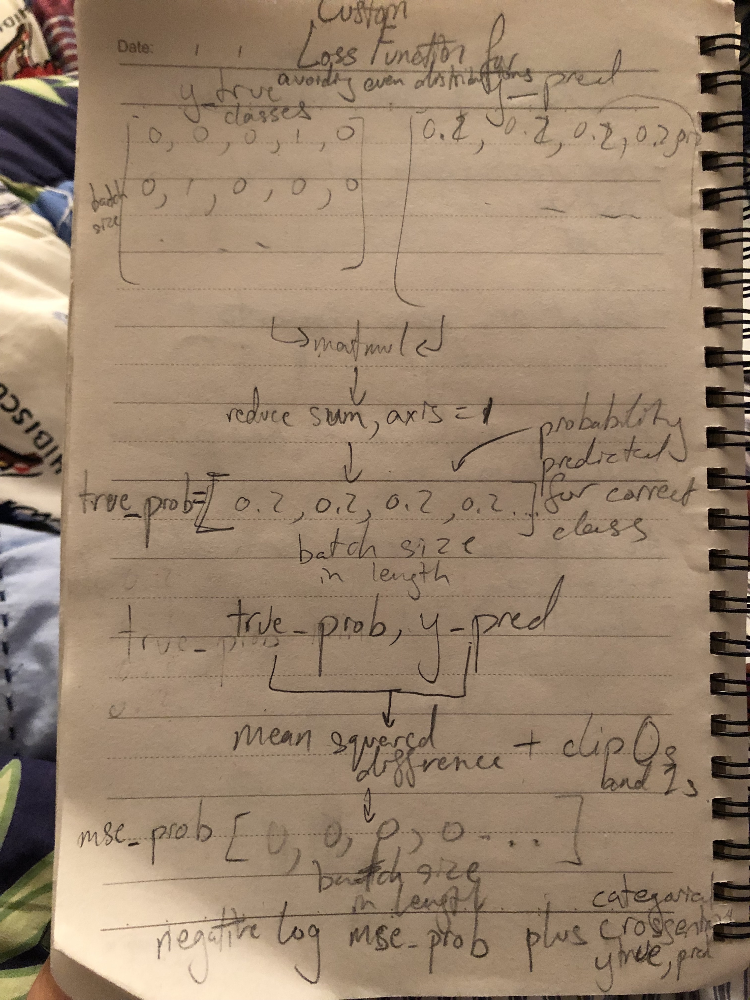

In [ ]:
# Component of the custom loss function that punishes evenly distributed classification probability
# Ex: Avoiding predictions like [0.2, 0.2, 0.2, 0.2, 0.2] in a 5-class problem

def even_distribution_loss(y_true, y_pred):

  # Keep only the classified probability of the correct class
  true_prob = tf.reduce_sum(y_true * y_pred, axis = 1)

  # Expand true probability to original size
  expanded_prob = tf.repeat(tf.reshape(true_prob, (-1,1)), tf.shape(y_pred)[-1], axis = 1)

  # Get mean squared error between true probability and predicted probability
  mse_prob = tf.reduce_mean(tf.square(expanded_prob - y_pred))

  # Clip loss to make sure no value is exactly 0 or 1 for log
  clipped_mse = tf.clip_by_value(mse_prob, backend.epsilon(), 1. - backend.epsilon())

  # Take negative log for loss stability and normalization
  return -tf.math.log(clipped_mse)


In [ ]:
crossentropy = tf.keras.losses.CategoricalCrossentropy()

In [ ]:
# Custom Loss function for training
def custom_loss(y_true, y_pred):

  # Categorical Crossentropy component
  cat_loss = crossentropy(y_true, y_pred)

  # Even Distribution component
  dist_loss = even_distribution_loss(y_true, y_pred)

  # Sum losses
  return cat_loss + tf.reduce_mean(dist_loss)

## Pipeline Construction Second-Try

In [ ]:
"""
Checklist:
- train_function
  - train_meta_learner
    - train_learner

- dataset_generator
"""

'\nChecklist:\n- train_function\n  - train_meta_learner\n    - train_learner\n\n- dataset_generator\n'

In [ ]:
# Function for training a learner with a meta-learner optimizer
def train_learner(D_train, metalearner, learner):
  """
  INPUTS:
  D_train (a Level 1 dataset containing X and y samples)
    - train_X
    - train_y
  metalearner (currently training metalearner)
  learner (new learner model to be trained in this function)

  OUTPUTS:
  cI (latest learenr weights optimized by metalearner, which is to be used to get the loss for the metalearner step)
  """

  # Initialize lists and newest cI from the learner model
  prev_hidden_states = [None]

  cI = tf.concat([tf.reshape(w, (-1,)) for w in learner.trainable_weights], axis = 0)

  prev_cI = [cI]

  # Loop through each step
  for epoch in range(LEARNER_EPOCHS):

    for step in range(LEARNER_STEPS_PER_EPOCH):

      # Get current batch of X and y
      train_X = D_train["X"][step * BATCH_SIZE: (step + 1) * BATCH_SIZE]
      train_y = D_train["y"][step * BATCH_SIZE: (step + 1) * BATCH_SIZE]

      # Since the gradients are individually calculated each loop,
      # I can reshape the cI BEFORE the gradient tape
      # and then flatten the resulting gradient (AFTER the gradient tape),
      # which then returns a flattened cI.

      # Therefore,
      # 1. create a separate function that reshapes the cI
      # 2. remove the separation part from functional_learner()
      # 3. implement process into code

      # Update: Did solve problem of gradient going to NaN,
      # but now gradient is just going to 0 and the model weights aren't budging.

      # Reshape latest learner weights 
      splitted_cI = reshape_weight(prev_cI[-1], learner)

      # Create gradient tape to watch learner weights
      with tf.GradientTape() as gt:
        gt.watch(splitted_cI)

        # Call functional learner and calculate loss
        pred = functional_learner(train_X, splitted_cI, learner, use_bias = USE_BIAS)
        loss = crossentropy(train_y, pred)

      # Calculate and flatten gradients for the latest weights
      gradients = gt.gradient(loss, splitted_cI)
      flattened_gradients = tf.concat([tf.reshape(g, (-1,)) for g in gradients], axis = 0)

      # Preprocess gradients and loss for metalearner
      grad_prep = preprocess_grad_or_loss(tf.cast(flattened_gradients, dtype = tf.float32))
      loss_prep = preprocess_grad_or_loss(tf.reduce_mean(loss)[tf.newaxis,...])

      # If this is first step, pass in cI (initial learner weights) as initial cell state for the Meta LSTM Cell
      if prev_hidden_states[-1] is None:
        cI, hidden_states = metalearner([loss_prep, grad_prep, flattened_gradients], hidden_states = prev_hidden_states[-1], c_i = cI)
      else:
        cI, hidden_states = metalearner([loss_prep, grad_prep, flattened_gradients], hidden_states = prev_hidden_states[-1])

      # Append results in this step
      prev_hidden_states.append(hidden_states)
      prev_cI.append(cI)

  return prev_cI[-1]

In [ ]:
import copy

In [ ]:
# Create a metric that takes into account the probability aspect of multi-class classification
def accuracy_try(output, target):
    batch_size = tf.shape(target)[0]

    # Find correct predictions
    pred = tf.argmax(output, axis = 1)
    correct = tf.equal(tf.cast(pred, tf.int32), tf.argmax(target, axis = 1, output_type = tf.int32))
    
    # Calculate percentage accuracy in batch
    return tf.reduce_sum(tf.cast(correct, tf.float32)) / tf.cast(batch_size, tf.float32)

In [ ]:
# Function for training a metalearner for one step
def train_meta_learner(D_train, D_test, metalearner):
  """
  INPUTS:
  D_train (used to train learner)
  - train_X
  - train_y
  D_test (used to evaluate learner and update metalearner)
  - test_X
  - test_y
  metalearner (metalearner to be trained)

  OUTPUTS:
  loss (current loss)
  acc (current accuracy)
  splitted_cI_meta (latest learner weights)
  """

  # Get Level 2 X and y samples for testing
  test_X, test_y = D_test["X"], D_test["y"]

  # Initialize new learner weights for training
  learner = get_learner_model(NUM_CLASSES, use_bias = USE_BIAS)

  # Create gradient tape context to watch metalearner's weights
  with tf.GradientTape() as meta_gt:

    meta_gt.watch(metalearner.trainable_variables)

    # Train learner
    cI = train_learner(D_train, metalearner, learner)

    # Evaluate latest trained learner and get loss and acc
    splitted_cI_meta = reshape_weight(cI, learner)
    test_pred = functional_learner(test_X, splitted_cI_meta, learner, use_bias = USE_BIAS)
    loss = crossentropy(test_y, test_pred)
    acc = accuracy_try(test_y, test_pred)

  # Calculate and apply gradients for metalearner
  # based on loss from latest learner
  meta_grads = meta_gt.gradient(loss, metalearner.trainable_variables)
  meta_optimizer.apply_gradients(zip(meta_grads, metalearner.trainable_variables))

  return loss, acc, splitted_cI_meta
                   

In [ ]:
# Over-arching function for training a metalearner
def train_function():

  # Initialize loss and accuracy trackers
  losses = []
  accuracies = []

  for epoch in range(EPOCHS):

    
    # The reason for creating new D_meta_train is
    # because preprocess_data() randomizes the order of
    # the X and y samples, thereby allowing new samples to be used
    D_meta_train = preprocess_data((X_train, y_train))

    # Create new training dataset generator for each epoch
    train_generator = create_flow(D_meta_train)

    for step, D in enumerate(train_generator):

      # Enforce a manual limit on steps per epoch
      if step >= STEPS_PER_EPOCH:
        break

      # Parse Level 1 datasets from a Level 0 sample
      D_train, D_test = D["train"], D["test"]

      # Train meta learner for one epoch and get most recent loss and accuracy
      curr_loss, curr_acc, c = train_meta_learner(D_train, D_test, metalearner)

      # Keep track of loss and accuracy
      losses.append(curr_loss)
      accuracies.append(curr_acc)

      print(f"EPOCH {epoch}; STEP {step};\nLatest loss: {curr_loss}\nLatest accuracy: {curr_acc}\n")
      
      # Save weights of metalearner for every 100 steps
      # in case something goes wrong
      if step % 100 == 0:
        checkpoint(metalearner, epoch, step)
    
  return c
      


In [ ]:
main_path = "/content/gdrive/MyDrive/Senior_Project_Stuff/Constructing_the_Model/Approach_1/models/"

In [ ]:
# Callback function for saving the latest metalearner weights
def checkpoint(m, epoch, step):
  m.save_weights(main_path + f"meta_learner_Ep{epoch}_Step{step}/model")

In [ ]:
# Initialize hyper-parameters
EPOCHS = 10
STEPS_PER_EPOCH = min(200, len(D_meta_train))
LEARNER_EPOCHS = 8
LEARNER_STEPS_PER_EPOCH = (NUM_CLASSES * NUM_SHOT) // BATCH_SIZE


In [ ]:
X_train.shape

(60000, 28, 28, 1)

In [ ]:
NUM_LEARNER_PARAMS

72298

In [ ]:
# Initialize metalearner
metalearner = MetaLearner(INPUT_SIZE, 20, NUM_LEARNER_PARAMS, BATCH_SIZE)

In [ ]:
# Initialize optimizer for the metalearner
meta_optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [ ]:
# Initialize Losses and Metrics
crossentropy = tf.keras.losses.CategoricalCrossentropy()
acc_metric = tf.keras.metrics.Accuracy()

In [ ]:
# Set verbose to only log errors
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [ ]:
EPOCHS

10

In [ ]:
# TRAIN METALEARNER

splitted_cI_meta = train_function() # perhaps reason for indecisiveness is because model can only make the same predictions. DONE
# Also look more into https://github.com/twitter-research/meta-learning-lstm to see how they did it. DONE
# Look more into the Vanishing Gradient Problem and how to solve it. DONE

# To try: Play around more with limiting negative weights and perhaps apply ReLU to learner kernels?
# https://keras.io/api/layers/constraints/

# For some reason, Conv2D layer weights lead to 0

Streaming output truncated to the last 5000 lines.
EPOCH 3; STEP 150;
Latest loss: 1.2718400955200195
Latest accuracy: 0.5400000214576721

EPOCH 3; STEP 151;
Latest loss: 1.2911447286605835
Latest accuracy: 0.5

EPOCH 3; STEP 152;
Latest loss: 1.5817553997039795
Latest accuracy: 0.36000001430511475

EPOCH 3; STEP 153;
Latest loss: 1.166571021080017
Latest accuracy: 0.5533333420753479

EPOCH 3; STEP 154;
Latest loss: 1.2468020915985107
Latest accuracy: 0.5666666626930237

EPOCH 3; STEP 155;
Latest loss: 1.1780617237091064
Latest accuracy: 0.5266666412353516

EPOCH 3; STEP 156;
Latest loss: 1.1597967147827148
Latest accuracy: 0.5600000023841858

EPOCH 3; STEP 157;
Latest loss: 1.1154670715332031
Latest accuracy: 0.6200000047683716

EPOCH 3; STEP 158;
Latest loss: 1.0549769401550293
Latest accuracy: 0.6200000047683716

EPOCH 3; STEP 159;
Latest loss: 1.0663173198699951
Latest accuracy: 0.6600000262260437

EPOCH 3; STEP 160;
Latest loss: 1.1600733995437622
Latest accuracy: 0.52666664123535

In [ ]:
# IT FINALLY WORKS, LIKE ACTUALLY

In [ ]:
# Save latest training
metalearner.save_weights(main_path + "meta_learner_Ep9_Step200/model")

## Compare Learner with Trained Optimizer with Learner with Adam Optimizer

### Where Metalearner does not adapt during testing

In [ ]:
# Create Generator for test datasets
test_generator = create_flow(D_meta_test)

In [ ]:
# Load Metalearner Optimizer
test_metalearner = MetaLearner(INPUT_SIZE, 20, NUM_LEARNER_PARAMS, BATCH_SIZE)


In [ ]:
test_metalearner.load_weights(main_path + "meta_learner_Ep9_Step200/model")

In [ ]:
# Load classic Adam Optimizer
adam_optimizer = tf.keras.optimizers.Adam(lr = .001)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# Create Metrics

# Loss
crossentropy = tf.keras.losses.CategoricalCrossentropy()

# Accuracy
accuracy = tf.keras.metrics.Accuracy()

In [ ]:
# Without Training the Meta Learner
meta_losses = []
meta_accs = []
adam_losses = []
adam_accs = []

for i, D in enumerate(test_generator):
  D_train, D_test = D["train"], D["test"]

  # Learners
  learner_w_meta = get_learner_model(NUM_CLASSES, True)

  learner_wo_meta = get_learner_model(NUM_CLASSES, True)
  learner_wo_meta.compile(
      loss = "categorical_crossentropy",
      optimizer = "adam",
      metrics = ["accuracy"]
  )

  X_test_sample, y_test_sample = D_test["X"], D_test["y"]

  # Train learner with Meta-learner
  cI = train_learner(D_train, test_metalearner, learner_w_meta)

  splitted_cI_meta = reshape_weight(cI, learner_w_meta)

  test_pred_meta = functional_learner(X_test_sample, splitted_cI_meta, learner_w_meta, use_bias = USE_BIAS)

  loss_meta = crossentropy(y_test_sample, test_pred_meta)

  acc_meta = accuracy_try(y_test_sample, test_pred_meta)


  # Train learner with Adam Optimizer
  learner_wo_meta.fit(
      x = D_train["X"],
      y = D_train["y"],
      batch_size = BATCH_SIZE,
      epochs = LEARNER_EPOCHS,
      verbose = 0
  )

  test_pred = learner_wo_meta(X_test_sample)

  loss_adam = crossentropy(y_test_sample, test_pred)

  acc_adam = accuracy_try(y_test_sample,test_pred)

  meta_losses.append(loss_meta)
  meta_accs.append(acc_meta)
  adam_losses.append(loss_adam)
  adam_accs.append(acc_adam)

  print(f"Test Data {i}:")
  print("--------------------------------------------")
  print(f"Adam Optimizer Loss: {loss_adam:03f}")
  print(f"Adam Optimizer Accuracy: {acc_adam:03f}")
  print("--------------------------------------------")
  print(f"Meta Learner Optimizer Loss: {loss_meta:03f}")
  print(f"Meta Learner Optimizer Accuracy: {acc_meta:03f}")
  print("--------------------------------------------")
  print(f"Compared Losses (Meta - Adam): {loss_meta - loss_adam}")
  print(f"Compared Accuracy (Meta - Adam): {acc_meta - acc_adam}")
  print("\n\n\n")

Test Data 0:
--------------------------------------------
Adam Optimizer Loss: 1.147275
Adam Optimizer Accuracy: 0.606667
--------------------------------------------
Meta Learner Optimizer Loss: 1.088308
Meta Learner Optimizer Accuracy: 0.566667
--------------------------------------------
Compared Losses (Meta - Adam): -0.0589672327041626
Compared Accuracy (Meta - Adam): -0.04000002145767212




Test Data 1:
--------------------------------------------
Adam Optimizer Loss: 1.457619
Adam Optimizer Accuracy: 0.546667
--------------------------------------------
Meta Learner Optimizer Loss: 1.205639
Meta Learner Optimizer Accuracy: 0.513333
--------------------------------------------
Compared Losses (Meta - Adam): -0.25198042392730713
Compared Accuracy (Meta - Adam): -0.03333336114883423




Test Data 2:
--------------------------------------------
Adam Optimizer Loss: 1.084285
Adam Optimizer Accuracy: 0.513333
--------------------------------------------
Meta Learner Optimizer Loss: 1

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

Text(0.5, 1.0, 'Difference in Loss')

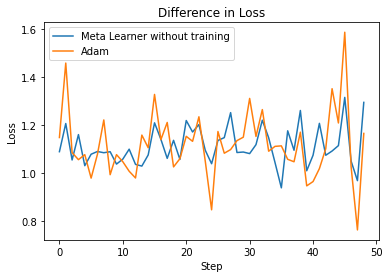

In [ ]:
plt.figure()
sns.lineplot(data = {
    "Step": [n for n, l in enumerate(meta_losses)],
    "Loss": [l.numpy() for l in meta_losses]
},
x = "Step", y = "Loss", label = "Meta Learner without training")
sns.lineplot(
    data = {
        "Step": [n for n, l in enumerate(adam_losses)],
        "Loss": [l.numpy() for l in adam_losses]
    },
    x = "Step", y = "Loss", label = "Adam"
)
plt.legend()
plt.title("Difference in Loss")

Text(0.5, 1.0, 'Difference in Accuracy')

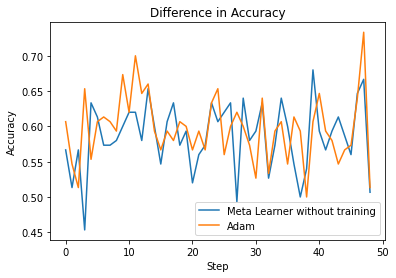

In [ ]:
plt.figure()
sns.lineplot(data = {
    "Step": [n for n, l in enumerate(meta_accs)],
    "Accuracy": [l.numpy() for l in meta_accs]
},
x = "Step", y = "Accuracy", label = "Meta Learner without training")
sns.lineplot(
    data = {
        "Step": [n for n, l in enumerate(adam_accs)],
        "Accuracy": [l.numpy() for l in adam_accs]
    },
    x = "Step", y = "Accuracy", label = "Adam"
)
plt.legend()
plt.title("Difference in Accuracy")

In [ ]:
# Find averages in loss and accuracy

print(f"Adam Average Loss {np.mean(adam_losses):03f}")
print(f"Adam Average Accuracy: {np.mean(adam_accs):03f}")
print("--------------------------------------------------------")
print(f"Meta-Learner Average Loss: {np.mean(meta_losses):03f}")
print(f"Meta-Learner Average Accuracy: {np.mean(meta_accs):03f}")

Adam Average Loss 1.116355
Adam Average Accuracy: 0.597007
--------------------------------------------------------
Meta-Learner Average Loss: 1.112246
Meta-Learner Average Accuracy: 0.586259


### Where Metalearner does adapt during testing

In [ ]:
# Create Generator for test datasets
test_generator = create_flow(D_meta_test)

In [ ]:
# Load Metalearner Optimizer
test_metalearner = MetaLearner(INPUT_SIZE, 20, NUM_LEARNER_PARAMS, BATCH_SIZE)


In [ ]:
test_metalearner.load_weights(main_path + "meta_learner_Ep9_Step200/model")

In [ ]:
# Load classic Adam Optimizer
adam_optimizer = tf.keras.optimizers.Adam(lr = .001)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# Create Metrics

# Loss
crossentropy = tf.keras.losses.CategoricalCrossentropy()

# Accuracy
accuracy = tf.keras.metrics.Accuracy()

In [ ]:
# Without Training the Meta Learner
meta_losses = []
meta_accs = []
adam_losses = []
adam_accs = []

for i, D in enumerate(test_generator):
  D_train, D_test = D["train"], D["test"]

  # Learners

  learner_wo_meta = get_learner_model(NUM_CLASSES, True)
  learner_wo_meta.compile(
      loss = "categorical_crossentropy",
      optimizer = "adam",
      metrics = ["accuracy"]
  )

  X_test_sample, y_test_sample = D_test["X"], D_test["y"]

  # Train learner with Meta-learner
  loss_meta, acc_meta, _ = train_meta_learner(D_train, D_test, test_metalearner)


  # Train learner with Adam Optimizer
  learner_wo_meta.fit(
      x = D_train["X"],
      y = D_train["y"],
      batch_size = BATCH_SIZE,
      epochs = LEARNER_EPOCHS,
      verbose = 0
  )

  test_pred = learner_wo_meta(X_test_sample)

  loss_adam = crossentropy(y_test_sample, test_pred)

  acc_adam = accuracy_try(y_test_sample,test_pred)

  meta_losses.append(loss_meta)
  meta_accs.append(acc_meta)
  adam_losses.append(loss_adam)
  adam_accs.append(acc_adam)

  print(f"Test Data {i}:")
  print("--------------------------------------------")
  print(f"Adam Optimizer Loss: {loss_adam:03f}")
  print(f"Adam Optimizer Accuracy: {acc_adam:03f}")
  print("--------------------------------------------")
  print(f"Meta Learner Optimizer Loss: {loss_meta:03f}")
  print(f"Meta Learner Optimizer Accuracy: {acc_meta:03f}")
  print("--------------------------------------------")
  print(f"Compared Losses (Meta - Adam): {loss_meta - loss_adam}")
  print(f"Compared Accuracy (Meta - Adam): {acc_meta - acc_adam}")
  print("\n\n\n")

Test Data 0:
--------------------------------------------
Adam Optimizer Loss: 1.220410
Adam Optimizer Accuracy: 0.593333
--------------------------------------------
Meta Learner Optimizer Loss: 1.255765
Meta Learner Optimizer Accuracy: 0.580000
--------------------------------------------
Compared Losses (Meta - Adam): 0.0353550910949707
Compared Accuracy (Meta - Adam): -0.013333320617675781




Test Data 1:
--------------------------------------------
Adam Optimizer Loss: 1.076004
Adam Optimizer Accuracy: 0.586667
--------------------------------------------
Meta Learner Optimizer Loss: 1.061909
Meta Learner Optimizer Accuracy: 0.660000
--------------------------------------------
Compared Losses (Meta - Adam): -0.014094352722167969
Compared Accuracy (Meta - Adam): 0.07333338260650635




Test Data 2:
--------------------------------------------
Adam Optimizer Loss: 1.219366
Adam Optimizer Accuracy: 0.593333
--------------------------------------------
Meta Learner Optimizer Loss: 1

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

Text(0.5, 1.0, 'Difference in Loss')

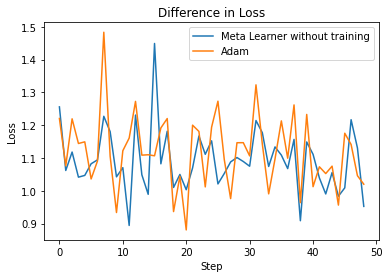

In [ ]:
plt.figure()
sns.lineplot(data = {
    "Step": [n for n, l in enumerate(meta_losses)],
    "Loss": [l.numpy() for l in meta_losses]
},
x = "Step", y = "Loss", label = "Meta Learner without training")
sns.lineplot(
    data = {
        "Step": [n for n, l in enumerate(adam_losses)],
        "Loss": [l.numpy() for l in adam_losses]
    },
    x = "Step", y = "Loss", label = "Adam"
)
plt.legend()
plt.title("Difference in Loss")

Text(0.5, 1.0, 'Difference in Accuracy')

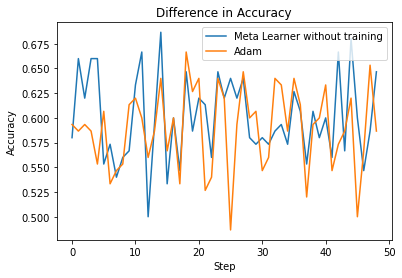

In [ ]:
plt.figure()
sns.lineplot(data = {
    "Step": [n for n, l in enumerate(meta_accs)],
    "Accuracy": [l.numpy() for l in meta_accs]
},
x = "Step", y = "Accuracy", label = "Meta Learner without training")
sns.lineplot(
    data = {
        "Step": [n for n, l in enumerate(adam_accs)],
        "Accuracy": [l.numpy() for l in adam_accs]
    },
    x = "Step", y = "Accuracy", label = "Adam"
)
plt.legend()
plt.title("Difference in Accuracy")

In [ ]:
# Find averages in loss and accuracy

print(f"Adam Average Loss {np.mean(adam_losses):03f}")
print(f"Adam Average Accuracy: {np.mean(adam_accs):03f}")
print("--------------------------------------------------------")
print(f"Meta-Learner Average Loss: {np.mean(meta_losses):03f}")
print(f"Meta-Learner Average Accuracy: {np.mean(meta_accs):03f}")

Adam Average Loss 1.118762
Adam Average Accuracy: 0.589116
--------------------------------------------------------
Meta-Learner Average Loss: 1.093172
Meta-Learner Average Accuracy: 0.600272
